In [1]:
import importlib
import sys
import os
import torch
import torch.optim as optim
import numpy as np
from datetime import datetime
import random
import matplotlib.pyplot as plt

# import own modules
# ----------------------------------------------------------------------------
import plot_functions as pf
import torch_functions as tofu
import market_functions as mf
from util import timediff_d_h_m_s
from data_creator import data_creator
from agents import simple_agent, hypo_agent
import FinMa
from hypotheses import check_hypothesis



importlib.reload(sys.modules["FinMa"])
importlib.reload(FinMa)
importlib.reload(pf)
importlib.reload(mf)
importlib.reload(tofu)
importlib.reload(sys.modules["hypotheses"])
importlib.reload(sys.modules["agents"])

from FinMa import FinMa, BSassets
from hypotheses import check_hypothesis
from agents import simple_agent, hypo_agent


In [2]:
import config_2.config as config

mp = config.MARKET_PARAMS
pgp = config.PG_PARAMS
pgtp = config.PG_TRAIN_PARAMS
a2cp = config.A2C_PARAMS
evp = config.EVAL_PARAMS
seed = config.SEED

In [3]:
# 1. Set `python` pseudo-random generator at a fixed value
random.seed(seed)

# 2. Set `numpy` pseudo-random generator at a fixed value
np.random.seed(seed)

# 3. Set 'torch' pseudo-random generator at a fixed value
torch.manual_seed(seed)

### 1. Market environment

In [4]:
interest = mp["interest"]
npath = pgp["npath"]
ntime = evp['ntime']
x0 = evp["x0"]
gamma = np.exp(-interest / ntime)

d = mp["d"]
s0 = mp["s0"]
mu = mp["mu"]
sig = mp["sig"]
cor = mp["cor"]
stds = np.sqrt(sig * np.eye(d))
Sigma = (stds @ cor @ stds).tolist()  # covariance structure of BM

In [5]:
weights = pgp['weights']
select_best_A2C = evp['select_best_A2C']

# additional states besides time, asset and portfolio value
additional_states = None
num_states = d + 2
if 'additional_states' in mp.keys():
    additional_states = mp['additional_states']
    l = len(additional_states)
    if 'signX' in additional_states:
        num_states += 1
        l -= 1
    num_states += l*d

# additional tasks besides maximizing reward
additional_tasks = None
if 'additional_tasks' in mp.keys():
    additional_tasks = mp['additional_tasks']

# connected network architecture for actor and critic
MTnetwork = False
if 'MTnetwork' in a2cp.keys():
    MTnetwork = a2cp['MTnetwork']

In [6]:
algos = ["PG", 'A2C']  #, "DH"]
colors = ["black" , "blue"]  # 'magenta']

In [7]:
# initiate strategy
models = {a: {"color": colors[i]} for i, a in enumerate(algos)}

In [8]:
# load models
for i in algos:
    if i == "DH":
        model = [tofu.DH_Net(num_states, d) for i in range(ntime)]
        m, f = tofu.get_latest(model, config.CONFIG_NO, i, filename=evp['filename_DH'])
        models[i]["model"] = m
        models[i]["foldername"] = f
    else:
        if additional_tasks is None:
            model = tofu.Actor_Net(num_states, 2 * d)
        else:
            model = tofu.Multitask_Actor_Net(dim=d, num_state=num_states,
            num_action=2 * d, add_tasks=additional_tasks, twolayered=True)
        if i == "A2C":
            m, f = tofu.get_latest(model, config.CONFIG_NO, i, select_best_A2C=select_best_A2C, filename=evp['filename_A2C'])
        else:
            m, f = tofu.get_latest(model, config.CONFIG_NO, i, filename=evp['filename_PG'])
        models[i]["model"] = m
        models[i]["foldername"] = f

        if i == "A2C":
            if MTnetwork:
                critic = tofu.Critic_Net(num_state=num_states, actor_base=model)
            else:
                critic = tofu.Critic_Net(num_states)
            modelname = f+"critic"
            if select_best_A2C:
                modelname = modelname + "_best"
            models[i]["critic"] = critic.load_state_dict(
                torch.load(modelname)
            )

foldername = "/".join(models[i]["foldername"].split("/")[:-2]) + "/"

loading files from folder: PG_17-01-2023_18:07 of config number 2.
loading files from folder: A2C_17-01-2023_17:01 of config number 2.


In [9]:
# reloading training weights from config file for PG
sys.path.insert(0, models['PG']['foldername'])
import config_PG as config_PG
models['PG']['weights'] = config_PG.PG_PARAMS['weights']
sys.path.remove(models['PG']['foldername'])


In [10]:
# reloading training weights from config file for A2C
sys.path.insert(0, models['A2C']['foldername'])
import config as config_A2C
weights_A2C = config_A2C.A2C_TRAIN_PARAMS['weights']
models['A2C']['weights'] = weights_A2C
sys.path.remove(models['A2C']['foldername'])

### 3. Initiate Market

In [11]:
asset_env = BSassets(
    interest=interest,
    s0=s0,
    sigma=Sigma,
    mu=mu,
    dim=d,
    ntime=ntime,
    npath=npath,
)
market_env = FinMa(
    pv0=x0,
    ntime=ntime,
    interest=interest,
    dim=d,
    npath=npath,
    asset_model=asset_env,
    weights=weights,
    additional_states=additional_states,
)

### 5. Testing and visualizing

In [12]:
save = True

### 1d & 2d

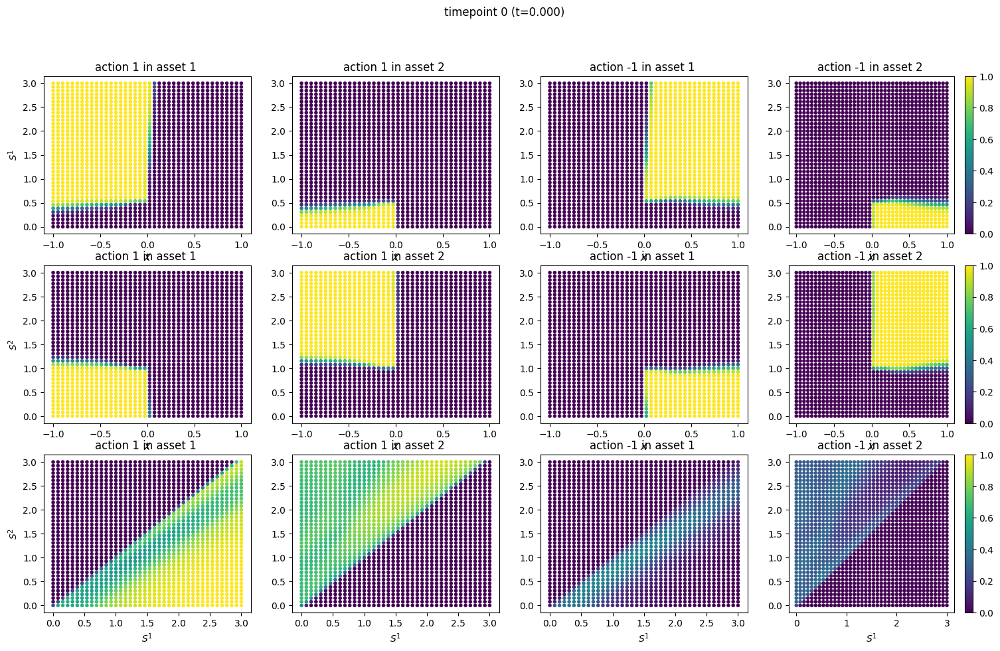

<Figure size 640x480 with 0 Axes>

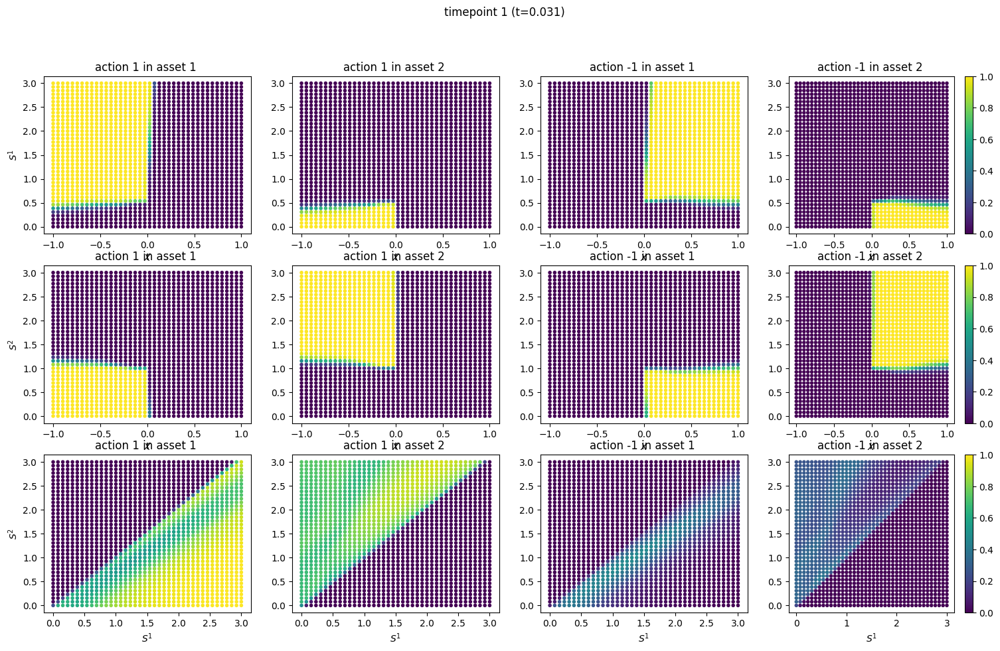

<Figure size 640x480 with 0 Axes>

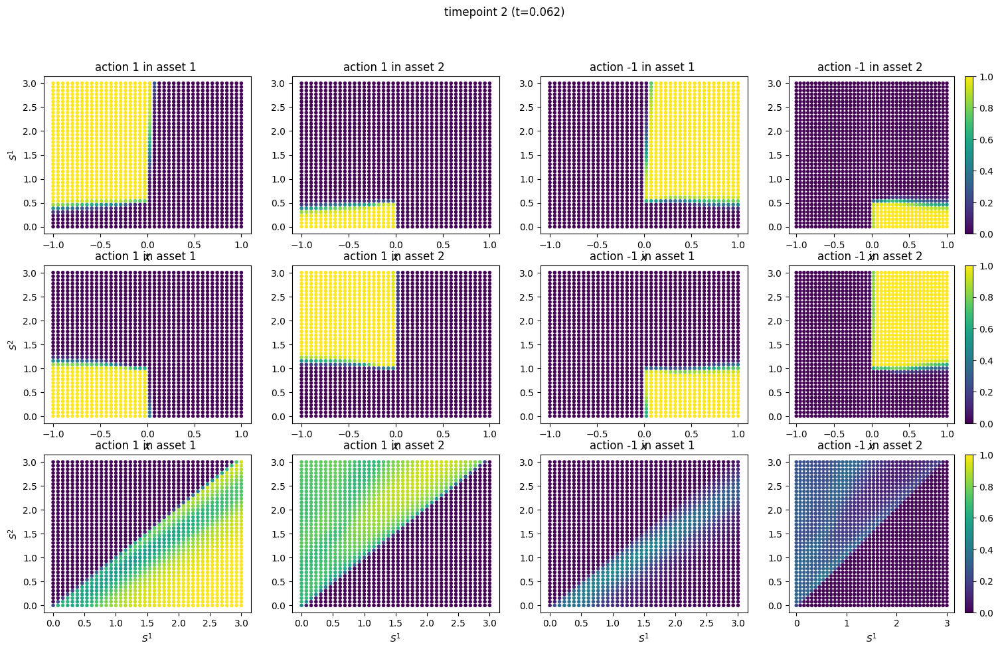

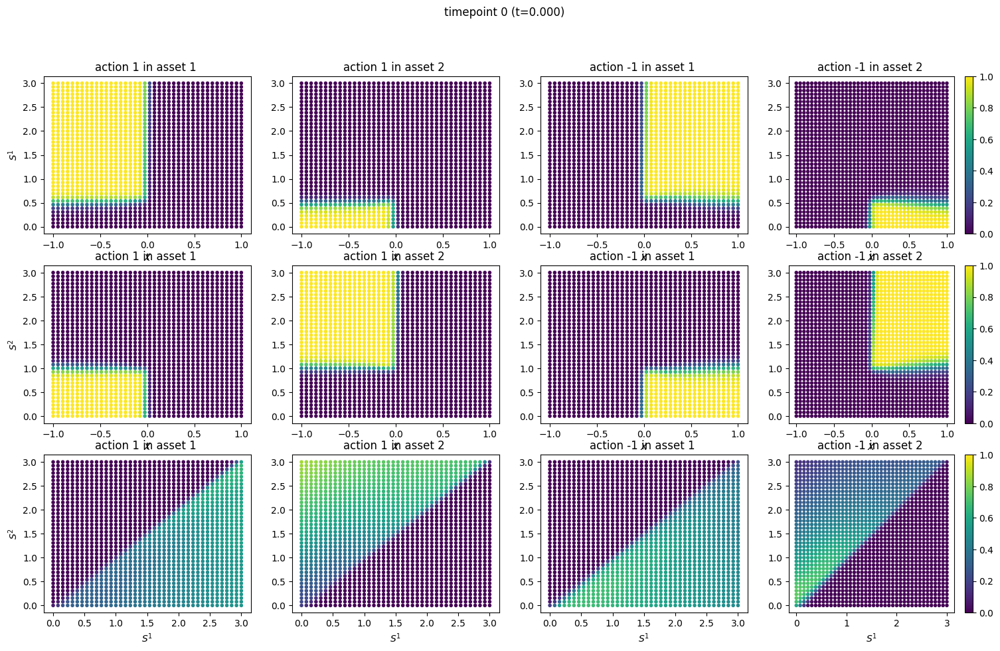

<Figure size 640x480 with 0 Axes>

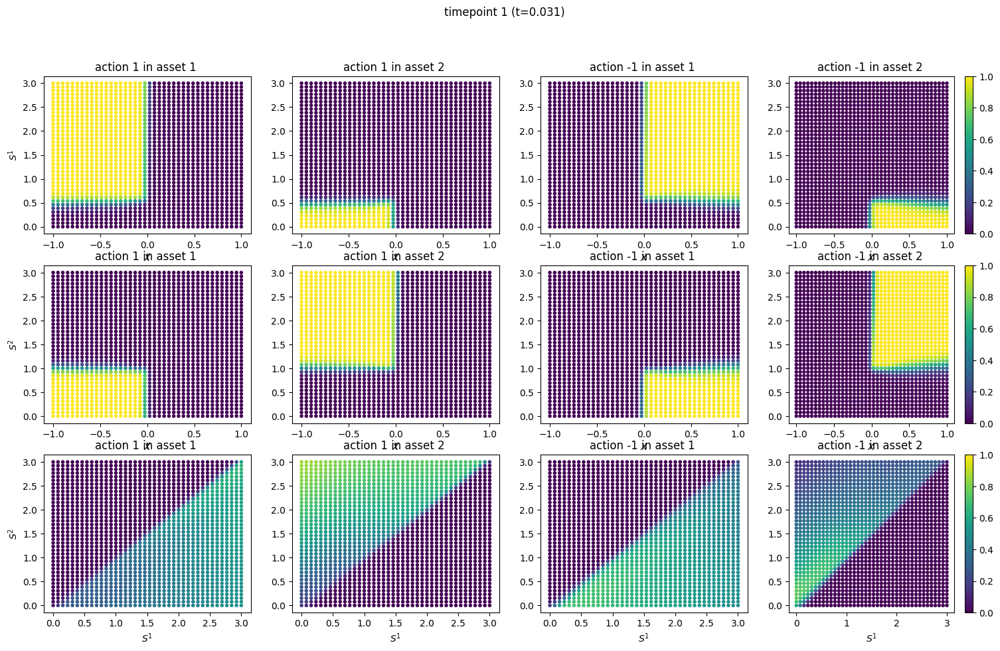

<Figure size 640x480 with 0 Axes>

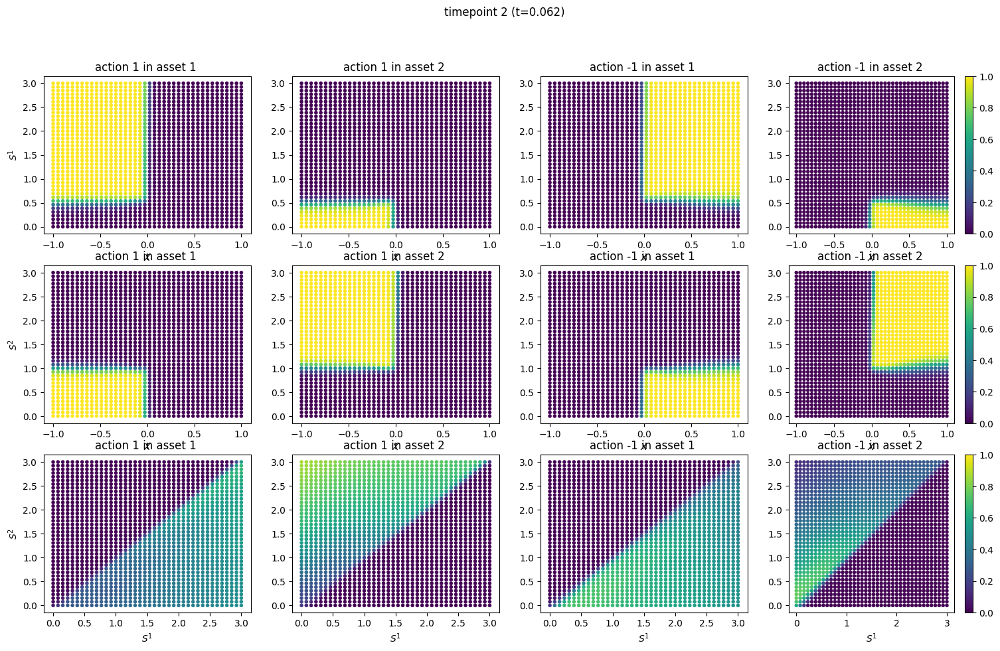

In [13]:
for i in algos:
    if d <= 2:
        pf.strategy_video(
            ntime=ntime,
            model=models[i]["model"],
            start=0,
            end=3,
            d=d,
            resolution=40,
            x_value=0,
            s1_value=1,
            s2_value=0.5,
            market_env=market_env,
        )

### Price and Value

In [14]:
ignore_weights = False

In [15]:
for i in algos:
    p = (
        mf.calc_price(
            model=models[i]["model"],
            asset_env=asset_env,
            x0=0,
            s0=[1 for i in range(d)],
            npath=1000,
            poss_action=market_env.poss_action,
            ntime=ntime,
            r=interest,
            hardmax=True,
            market_env=market_env,
            ignore_weights=ignore_weights,
            weights=models[i]["weights"],
        )
    )
    print(f"price for {i} algo: {p}\n")

price for PG algo: 0.10650129244246775

price for A2C algo: 0.10568175009652837



price surface for PG algo:

price surface for A2C algo:



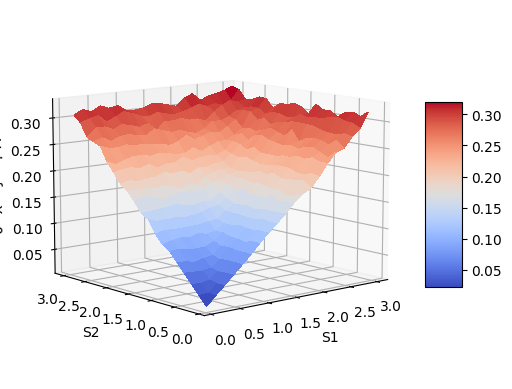

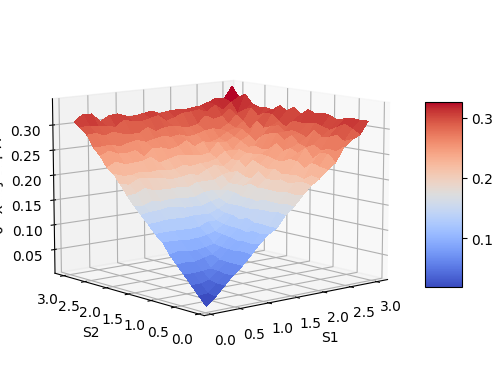

In [16]:
for i in algos:
    if d > 1:
        f_test = np.vectorize(
            lambda x, y: mf.calc_price(
                model=models[i]["model"],
                asset_env=asset_env,
                x0=0,
                s0=[x, y] + [1 for i in range(d - 2)],
                npath=1000,
                poss_action=market_env.poss_action,
                ntime=ntime,
                r=interest,
                hardmax=True,
                market_env=market_env,
                ignore_weights=ignore_weights,
                weights=models[i]["weights"],
            )
        )
    else:
        f_test = np.vectorize(
            lambda x, y: mf.calc_price(
                model=models[i]["model"],
                asset_env=asset_env,
                x0=x,
                s0=y,
                npath=1000,
                poss_action=market_env.poss_action,
                ntime=ntime,
                r=interest,
                hardmax=True,
                market_env=market_env,
                ignore_weights=ignore_weights,
                weights=models[i]["weights"],
            )
        )
    print(f"price surface for {i} algo:\n")
    pf.plot_value(
        valuefun_vec=f_test,
        d=min(d, 2),
        smax=3,
        resolution=20,
        save=save,
        name=models[i]["foldername"],
    )

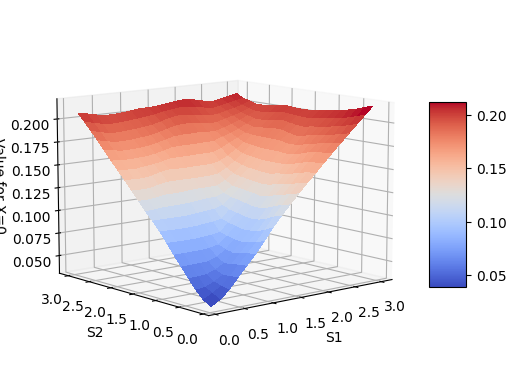

In [17]:
# critic already discounted
#--------------------------------
if "A2C" in algos:    
    factor = 1/(2*weights_A2C[1]+weights_A2C[0])
    def critic_fun(x,y):
        if d > 1:
            tensor_input =torch.tensor([[0, x0] + [x, y] + [1 for i in range(d - 2)]], dtype=torch.float)
            if additional_states is not None:
                tensor_input = market_env.create_additional_states(tensor_input)
            
            if not ignore_weights:
                return((critic(tensor_input).detach().numpy()+ weights_A2C[1]*x0
                        )*factor)
            else:
                return(critic(tensor_input).detach().numpy())
        
        else:
            tensor_input =torch.tensor([[1/ntime] + [x, y]], dtype=torch.float)
            if additional_states is not None:
                tensor_input = market_env.create_additional_states(tensor_input)
            
            if not ignore_weights:
                return((critic(tensor_input).detach().numpy()+ weights_A2C[1]*x)*factor)
            else:
                return(critic(tensor_input).detach().numpy())
                
    f_critic = np.vectorize(critic_fun)

    pf.plot_value(
        valuefun_vec=f_critic,
        d=min(d, 2),
        smax=3,
        resolution=20,
        save=save,
        name=models['A2C']["foldername"] + "critic_",
    )

### trade with trained agent

portfolio values for trades with PG algo:

finished predicting strategy

100.00% correct actions at time 0
87.50% correct actions at time 1
88.90% correct actions at time 2
88.40% correct actions at time 3
90.30% correct actions at time 4
91.80% correct actions at time 5
91.80% correct actions at time 6
91.80% correct actions at time 7
90.80% correct actions at time 8
92.60% correct actions at time 9
90.50% correct actions at time 10
90.30% correct actions at time 11
91.00% correct actions at time 12
90.70% correct actions at time 13
91.00% correct actions at time 14
91.90% correct actions at time 15
89.70% correct actions at time 16
90.30% correct actions at time 17
90.80% correct actions at time 18
89.90% correct actions at time 19
90.30% correct actions at time 20
89.40% correct actions at time 21
90.00% correct actions at time 22
90.20% correct actions at time 23
90.10% correct actions at time 24
89.20% correct actions at time 25
90.60% correct actions at time 26
91.00% correct act

/scratch/users/hwutte/Documents/Research/Passport_Option/PPPO/ML4PassportOptions/plot_functions.py:504: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


portfolio values for trades with A2C algo:

finished predicting strategy

0.00% correct actions at time 0
68.80% correct actions at time 1
78.20% correct actions at time 2
81.30% correct actions at time 3
82.90% correct actions at time 4
85.50% correct actions at time 5
85.60% correct actions at time 6
87.10% correct actions at time 7
88.00% correct actions at time 8
89.10% correct actions at time 9
89.10% correct actions at time 10
89.80% correct actions at time 11
89.90% correct actions at time 12
90.70% correct actions at time 13
90.90% correct actions at time 14
91.40% correct actions at time 15
90.40% correct actions at time 16
92.10% correct actions at time 17
92.70% correct actions at time 18
91.90% correct actions at time 19
91.80% correct actions at time 20
92.30% correct actions at time 21
93.20% correct actions at time 22
93.80% correct actions at time 23
92.30% correct actions at time 24
93.60% correct actions at time 25
93.00% correct actions at time 26
94.10% correct acti

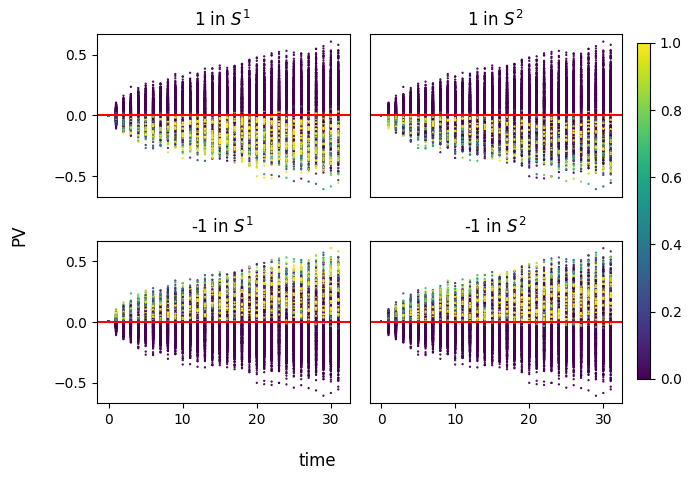

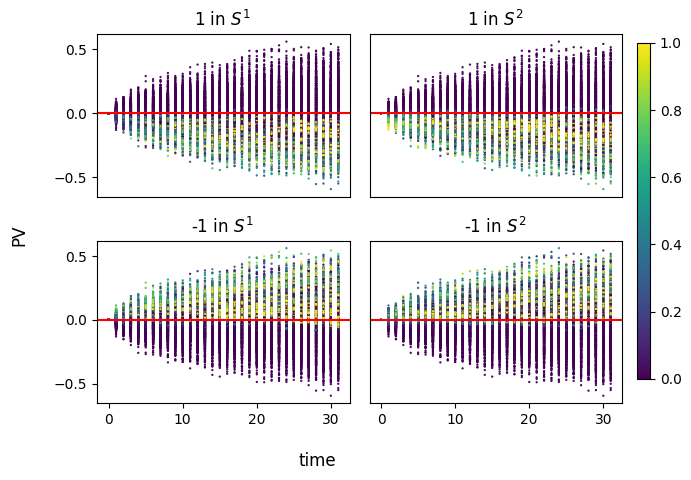

In [18]:
# PREDICT STRATEGY
npath2plot = 1000

x0path = np.expand_dims(np.repeat(0, npath2plot), axis=1)

# create new market data or load standard data set

W, S2plot = mf.create_paths(
    filepath="",
    npath=npath2plot,
    ntime=ntime,
    Sigma=Sigma,
    mu=mu,
    r=interest,
    s0=np.ones((npath2plot, d)),
    retBM=True,
    save_paths=False,
)
for i in algos:
    print(f"portfolio values for trades with {i} algo:\n")

    # determine approximated strategy (samples from NN-probability for the prediction)
    q, p = mf.strategies(
        npath=npath2plot,
        ntime=ntime,
        d=d,
        model=models[i]["model"],
        S=S2plot,
        r=interest,
        poss_action=market_env.poss_action,
        hardmax=True,
        x0path=x0path,
        market_env=market_env,
    )

    print("finished predicting strategy\n")

    # portfolio value when trading with fitted strategy
    pv = mf.portfolio_value(
        q,
        S2plot,
        interest,
        x0path,
    )

    if i != "DH":
        correct_percentages = check_hypothesis(p, pv, S2plot, market_env)
    if d < 3:
        # Probability plots

        x = S2plot[:, :, 0]  # x-axis (however if timescale==True, x-axis will be time)
        timescale = True
        y = pv  # y-axis

        strat = q if i == "DH" else p
        omegas = range(0, npath2plot, 2 ** 0)  # paths to plot

        pf.plot_probabilities(
            d=d,
            timerange=ntime,
            omegas=omegas,
            y=y,
            strategy_process=strat,
            poss_action=market_env.poss_action,
            x=x,
            timescale=timescale,
            xlabel="S1",  # will be overwritten if timescale==True
            ylabel="PV",
            connectpaths=False,
            save=save,
            name=models[i]["foldername"],
            relaxed=False if i == 'DH' else True,
        )  # set to true if paths should be connected by lines

### compare to other strats

In [19]:
npath2test = 100000
x_start = evp['x0']

In [20]:
Stest, Wtest = asset_env.create_paths(
    ntimesteps=ntime,
    npaths=npath2test,
    keep_env_pathdim=False,
    initial_val=np.ones((npath2test, 1, d)),
)

In [21]:
pv_TA = {i: 0 for i in algos}

for i in algos:
    pv_TA[i] = mf.calc_state(
        model=models[i]["model"],
        poss_action=market_env.poss_action,
        d=d,
        x=x_start*np.ones((npath2test, 1)),
        s=Stest,
        r=interest,
        ntime=ntime,
        t_start=0,
        t_end=ntime,
        hardmax=True,
        market_env=market_env,
    ).squeeze()

In [22]:
pv_const = mf.calc_state(
    model=simple_agent(market_env, random=False),
    poss_action=market_env.poss_action,
    d=d,
    x=x_start*np.ones((npath2test, 1)),
    s=Stest,
    r=interest,
    ntime=ntime,
    t_start=0,
    t_end=ntime,
    hardmax=True,
    market_env=market_env,
).squeeze()

In [23]:
pv_rand = mf.calc_state(
    model=simple_agent(market_env, random=True),
    poss_action=market_env.poss_action,
    d=d,
    x=x_start*np.ones((npath2test, 1)),
    s=Stest,
    r=interest,
    ntime=ntime,
    t_start=0,
    t_end=ntime,
    hardmax=True,
).squeeze()

In [24]:
pv_opt = mf.calc_state(
    model=hypo_agent(market_env),
    poss_action=market_env.poss_action,
    d=d,
    x=x_start*np.ones((npath2test, 1)),
    s=Stest,
    r=interest,
    ntime=ntime,
    t_start=0,
    t_end=ntime,
    hardmax=True,
).squeeze()

In [25]:
l_pv_TA = list(pv_TA.values())

In [26]:
cols = ["green", "red", "orange"] + [models[a]["color"] for a in algos] 
algos_ex = ["Opt", "Const", "Rand"] + algos

means are [-0.003681521224665886, -0.06357257214356127, -0.0002745385933135508, -0.0073683938148632055, 0.00911572922319126]



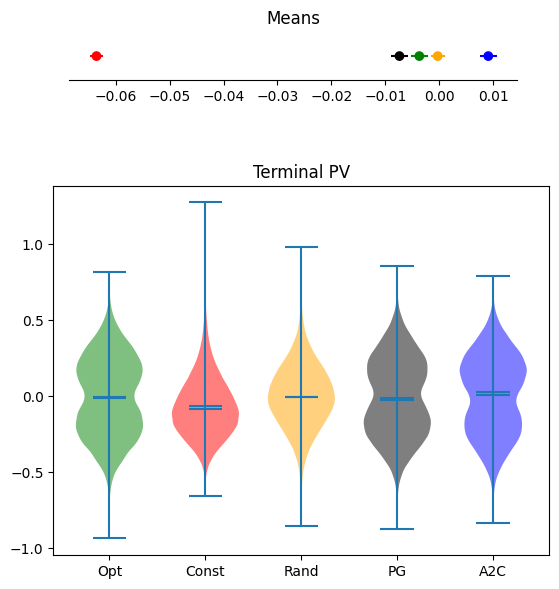

In [27]:
all_pv = [pv_opt, pv_const, pv_rand] + l_pv_TA

pf.custom_violinplot(
    all_pv,
    "Terminal PV",
    save,
    foldername + "PV_violins",
    cols,
    algos_ex,
    npath2test,
)

means are [0.22168283309786918, 0.17267548444056527, 0.16630898424473398, 0.22134599763991494, 0.22116848732191047]



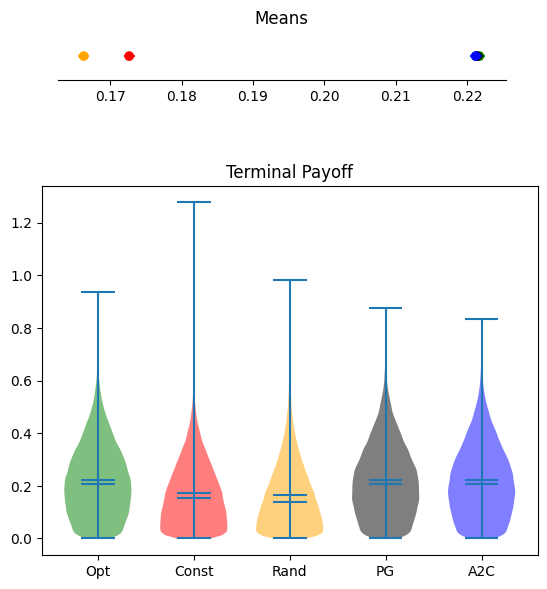

In [28]:
all_pv_pp = [np.abs(x) for x in all_pv]
pf.custom_violinplot(
    all_pv_pp,
    "Terminal Payoff",
    save,
    foldername + "PV_ABS_violins",
    cols,
    algos_ex,
    npath2test,
)